# Object Detection Demo
Welcome to the object detection inference walkthrough!  This notebook will walk you step by step through the process of using a pre-trained model to detect objects in an image. Make sure to follow the [installation instructions](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/installation.md) before you start.

# Imports

In [1]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from distutils.version import StrictVersion
from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image

# This is needed since the notebook is stored in the object_detection folder.
sys.path.append("..")
from object_detection.utils import ops as utils_ops
from object_detection.builders import model_builder
from google.protobuf import text_format
import tensorflow as tf
import xml.etree.ElementTree as ET


if StrictVersion(tf.__version__) < StrictVersion('1.9.0'):
  raise ImportError('Please upgrade your TensorFlow installation to v1.9.* or later!')


/Users/mbaltac/Home/MasterThesis/other/models/research/object_detection/utils/visualization_utils.py:27: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to 'module://ipykernel.pylab.backend_inline' by the following code:
  File "/Users/mbaltac/anaconda3/lib/python3.6/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/Users/mbaltac/anaconda3/lib/python3.6/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/Users/mbaltac/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/Users/mbaltac/anaconda3/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/Users/mbaltac/anaconda3/lib/python3.6/site-packages/ipyker

## Env setup

In [2]:
# This is needed to display the images.
%matplotlib inline

## Object detection imports
Here are the imports from the object detection module.

In [3]:
from utils import label_map_util

from utils import visualization_utils as vis_util

/Users/mbaltac/Home/MasterThesis/other/models/research/object_detection/utils/visualization_utils.py:27: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to 'module://ipykernel.pylab.backend_inline' by the following code:
  File "/Users/mbaltac/anaconda3/lib/python3.6/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/Users/mbaltac/anaconda3/lib/python3.6/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/Users/mbaltac/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/Users/mbaltac/anaconda3/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/Users/mbaltac/anaconda3/lib/python3.6/site-packages/ipyker

# Model preparation 

## Variables

Any model exported using the `export_inference_graph.py` tool can be loaded here simply by changing `PATH_TO_FROZEN_GRAPH` to point to a new .pb file.  

By default we use an "SSD with Mobilenet" model here. See the [detection model zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/detection_model_zoo.md) for a list of other models that can be run out-of-the-box with varying speeds and accuracies.

In [4]:
# What model to download.
MODEL_NAME = 'prod_faster_rcnn_resnet50_coco'
MODEL_FILE = MODEL_NAME + '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/'

# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_FROZEN_GRAPH = MODEL_NAME + '/frozen_inference_graph.pb'

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = os.path.join('data', 'mscoco_label_map.pbtxt')

## Download Model

In [5]:
# opener = urllib.request.URLopener()
# opener.retrieve(DOWNLOAD_BASE + MODEL_FILE, MODEL_FILE)
# tar_file = tarfile.open(MODEL_FILE)
# for file in tar_file.getmembers():
#   file_name = os.path.basename(file.name)
#   if 'frozen_inference_graph.pb' in file_name:
#     tar_file.extract(file, os.getcwd())

## Load a (frozen) Tensorflow model into memory.

In [6]:
detection_graph = tf.Graph()
with detection_graph.as_default():
  od_graph_def = tf.GraphDef()
  with tf.gfile.GFile(PATH_TO_FROZEN_GRAPH, 'rb') as fid:
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')

## Loading label map
Label maps map indices to category names, so that when our convolution network predicts `5`, we know that this corresponds to `airplane`.  Here we use internal utility functions, but anything that returns a dictionary mapping integers to appropriate string labels would be fine

In [7]:
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

## Helper code

In [8]:
def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

# Detection

In [9]:
# For the sake of simplicity we will use only 2 images:
# image1.jpg
# image2.jpg
# If you want to test the code with your images, just add path to the images to the TEST_IMAGE_PATHS.
PATH_TO_TEST_IMAGES_DIR = '/Users/mbaltac/Home/MasterThesis/MasterThesis/Kickoff_MihaiBaltac/session_122923'
TEST_IMAGE_PATHS = [ os.path.join(PATH_TO_TEST_IMAGES_DIR, f) for f in os.listdir(PATH_TO_TEST_IMAGES_DIR) if f.endswith(".jpg") ]
SESSIONS_PATH = "/Users/mbaltac/Home/MasterThesis/MasterThesis/labeled_images_shopping_sessions/labeled"
# Size, in inches, of the output images.
IMAGE_SIZE = (30, 20)

In [10]:
def get_labels(fpath: str) :
    fpath = os.path.abspath(fpath)
    tree = ET.parse(fpath)
    root = tree.getroot()

    img_path = os.path.abspath(os.path.join(os.path.dirname(fpath), "..", root.find("filename").text))
    img_label = []
    size = root.find("size")
    width = float(size.find("width").text)
    height = float(size.find("height").text)
    for child in root.findall("object"):
        name = child.find("name").text
        bndbox = child.find("bndbox")
        xmin = float(bndbox.find("xmin").text)
        ymin = float(bndbox.find("ymin").text)
        xmax = float(bndbox.find("xmax").text)
        ymax = float(bndbox.find("ymax").text)

        img_label.append((xmin, ymin, xmax, ymax))

    return img_label

In [11]:
def bb_intersection_over_union(boxA, boxB):
    # determine the (x, y)-coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    # compute the area of intersection rectangle
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)

    # compute the area of both the prediction and ground-truth
    # rectangles
    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)

    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = interArea / float(boxAArea + boxBArea - interArea)
 
    # return the intersection over union value
    return iou


In [12]:
def run_inference_for_single_image(image, graph):
  with graph.as_default():
    with tf.Session() as sess:
      # Get handles to input and output tensors
      ops = tf.get_default_graph().get_operations()
      all_tensor_names = {output.name for op in ops for output in op.outputs}
      tensor_dict = {}
      for key in [
          'num_detections', 'detection_boxes', 'detection_scores',
          'detection_classes'
      ]:
        tensor_name = key + ':0'
        if tensor_name in all_tensor_names:
          tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(
              tensor_name)
      image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')

      # Run inference
      output_dict = sess.run(tensor_dict,
                             feed_dict={image_tensor: np.expand_dims(image, 0)})

      # all outputs are float32 numpy arrays, so convert types as appropriate
      output_dict['num_detections'] = int(output_dict['num_detections'][0])
      output_dict['detection_classes'] = output_dict[
          'detection_classes'][0].astype(np.uint8)
      output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
      output_dict['detection_scores'] = output_dict['detection_scores'][0]
            
  return output_dict

In [13]:
def filter_detections(output_dict, detection_labels, max_iou=.3, max_filtered=3):
    filtered_output_dict = dict()
    
    filtered_idx = []
    detections = output_dict["detection_boxes"]
    for i in range(len(detections)):
        detection = detections[i]
        add_to_filter = True
        for label in detection_labels:
            if bb_intersection_over_union(detection, label) > max_iou:
                add_to_filter = False
                break
                
        for fi in filtered_idx:
            if bb_intersection_over_union(detection, detections[fi]) > max_iou:
                add_to_filter = False
                break
                
        if add_to_filter:
            filtered_idx.append(i)
        
        if len(filtered_idx) > max_filtered:
            break
        
    
    
    filtered_output_dict['detection_boxes'] = output_dict['detection_boxes'][filtered_idx]
    filtered_output_dict['detection_classes'] = output_dict['detection_classes'][filtered_idx]
    filtered_output_dict['detection_scores'] = output_dict['detection_scores'][filtered_idx]
    
    return filtered_output_dict
    

.DS_Store
117653
117653 1528987969.912995_BOTTOM_FRONT_EventResolved.jpg 1
117653 1528987985.530659_BOTTOM_FRONT_EventResolved.jpg 1
117653 1528988108.429058_BOTTOM_FRONT_EventResolved.jpg 2
117653 1528988152.222282_BOTTOM_FRONT_EventResolved.jpg 1
117653 1528988261.542053_BOTTOM_FRONT_stop_motion.jpg 0
a murit dumitru
117653 1528988744.633756_BOTTOM_FRONT_EventResolved.jpg 1
117653 1528988809.134680_BOTTOM_FRONT_EventResolved.jpg 1
117653 1528988812.111132_BOTTOM_FRONT_EventResolved.jpg 0
a murit dumitru
117653 1528988861.546387_BOTTOM_FRONT_stop_motion.jpg 0
a murit dumitru
117653 1528988866.364830_BOTTOM_FRONT_EventResolved.jpg 1
117653 1528988929.776579_BOTTOM_FRONT_EventResolved.jpg 2
117653 1528988932.963139_BOTTOM_FRONT_EventResolved.jpg 0
a murit dumitru
117653 1528988937.458891_BOTTOM_FRONT_EventResolved.jpg 0
a murit dumitru
117653 1528989009.352452_BOTTOM_FRONT_EventResolved.jpg 1
117653 1528989013.197144_BOTTOM_FRONT_EventResolved.jpg 0
a murit dumitru
117653 1528989017.172

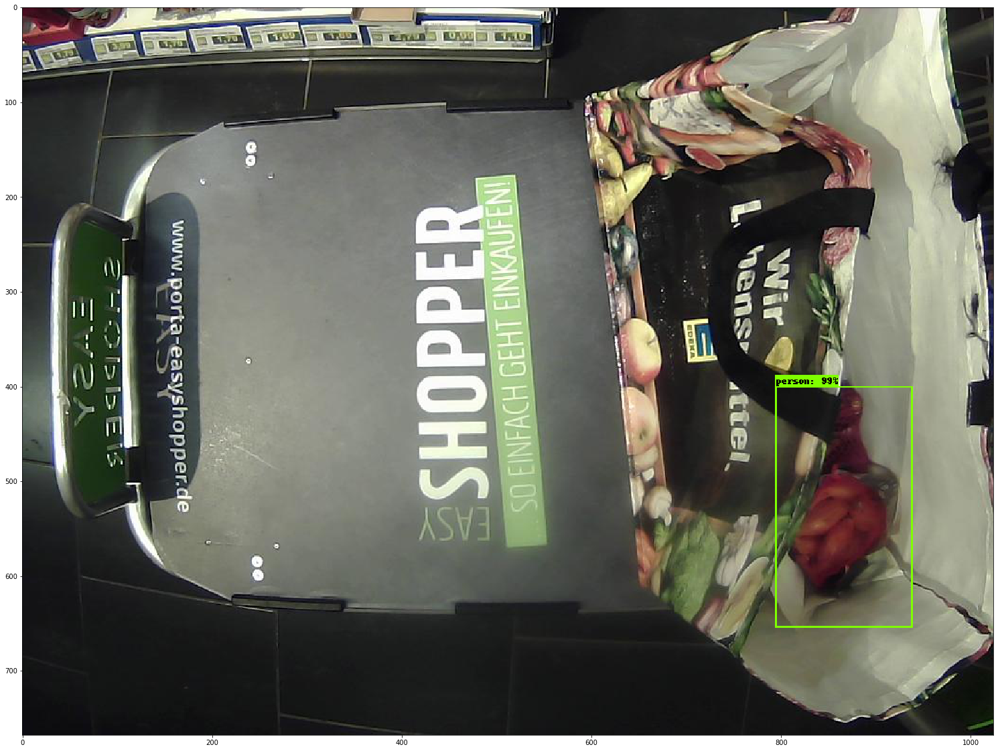

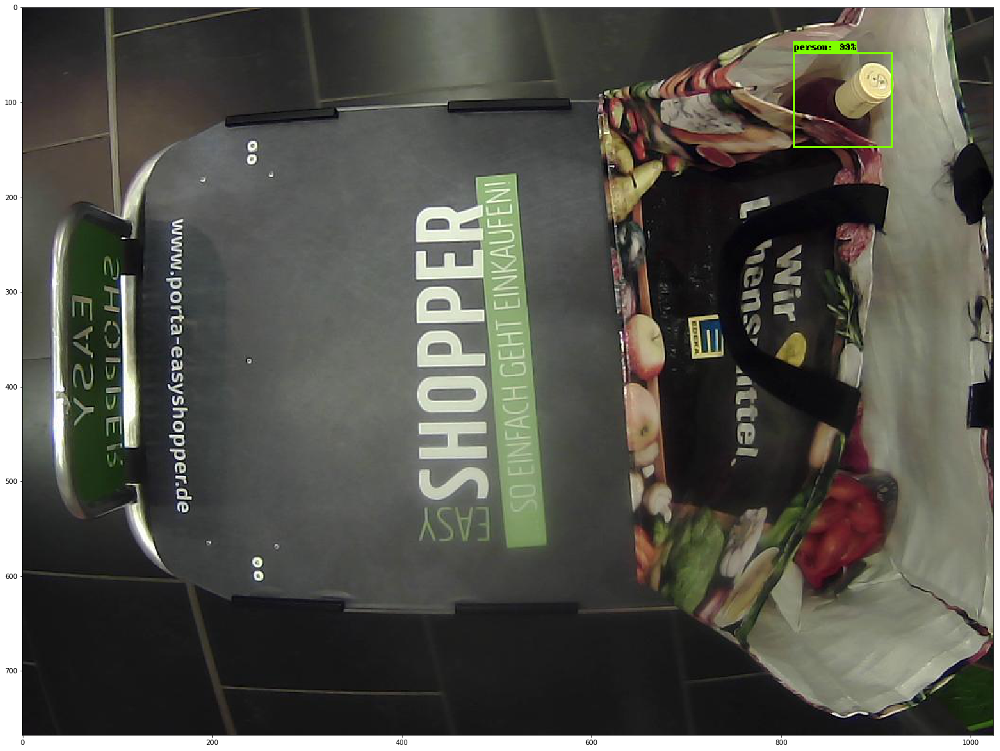

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


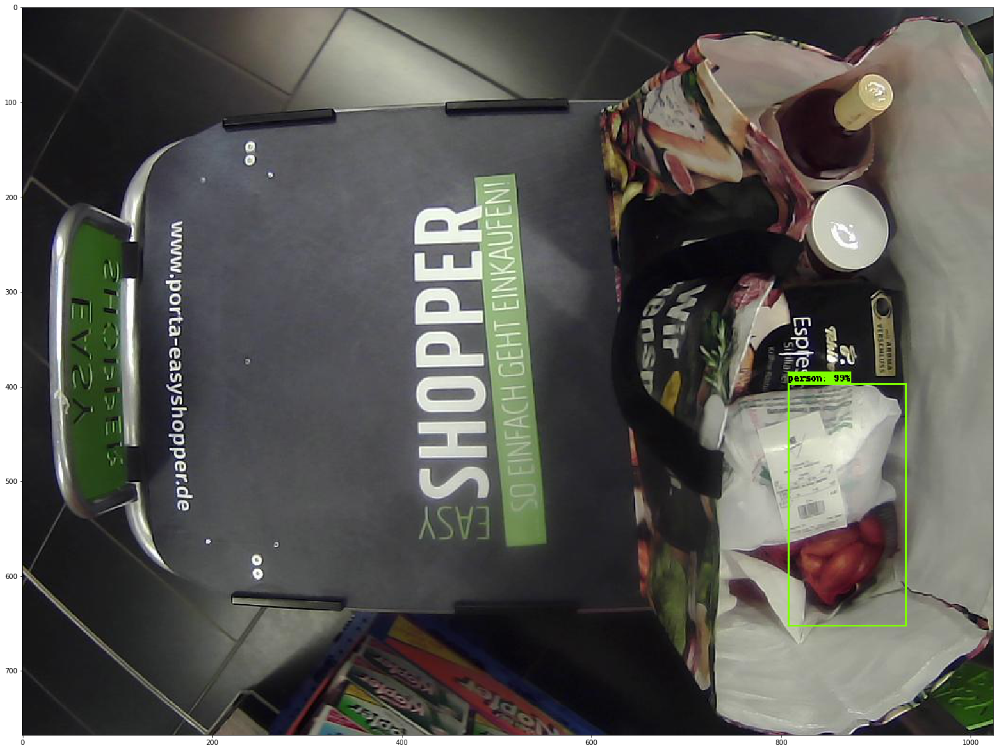

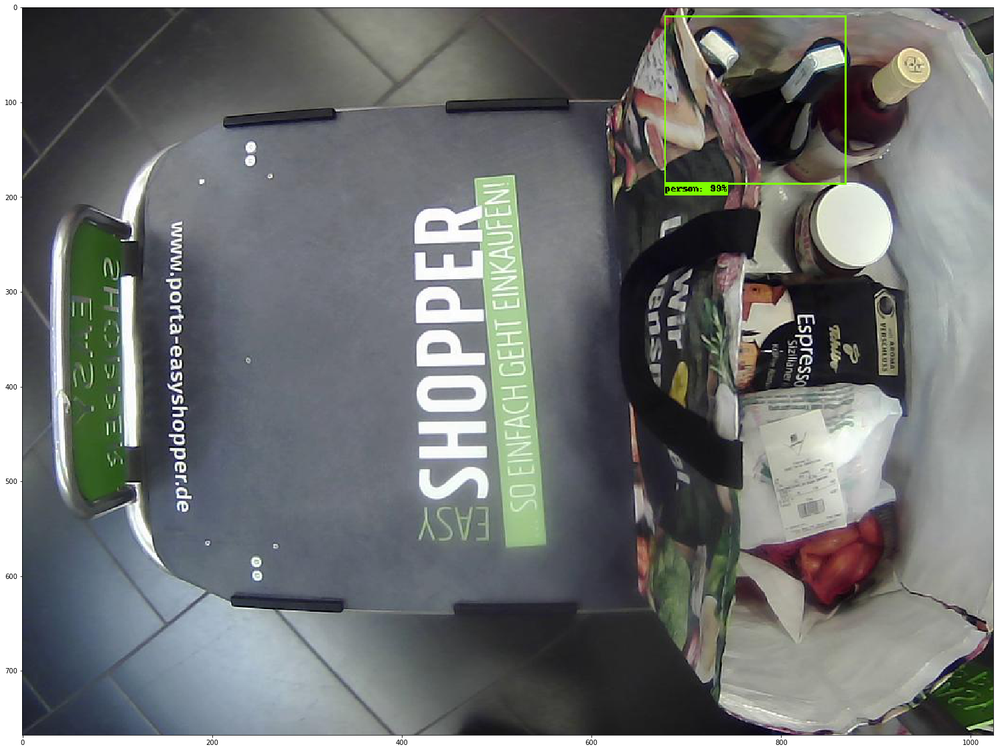

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


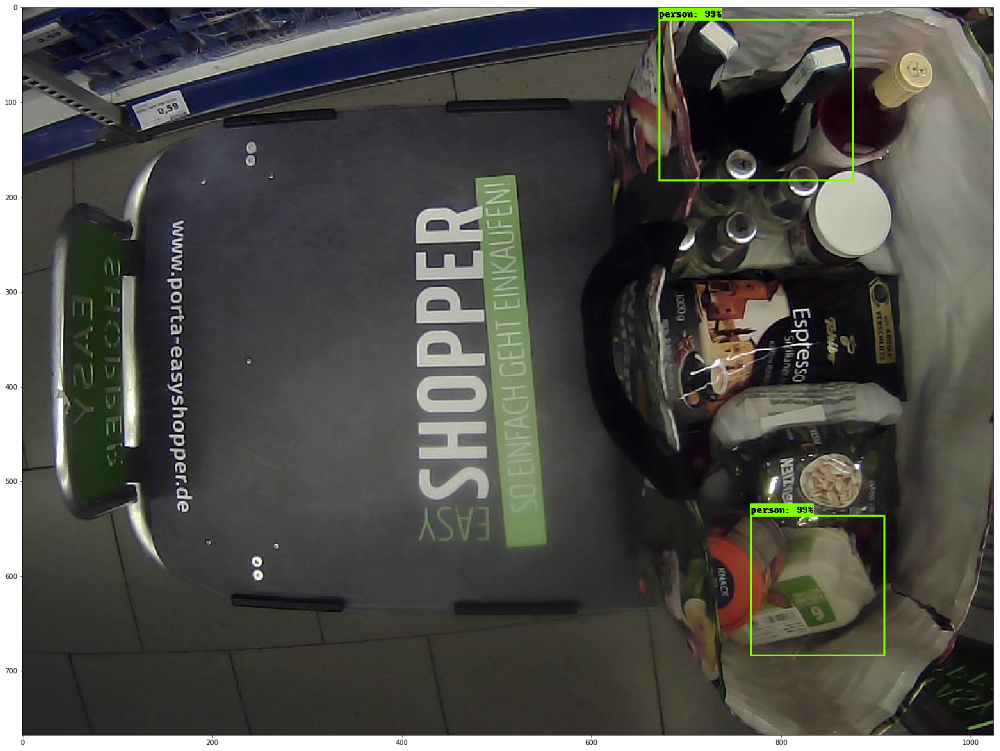

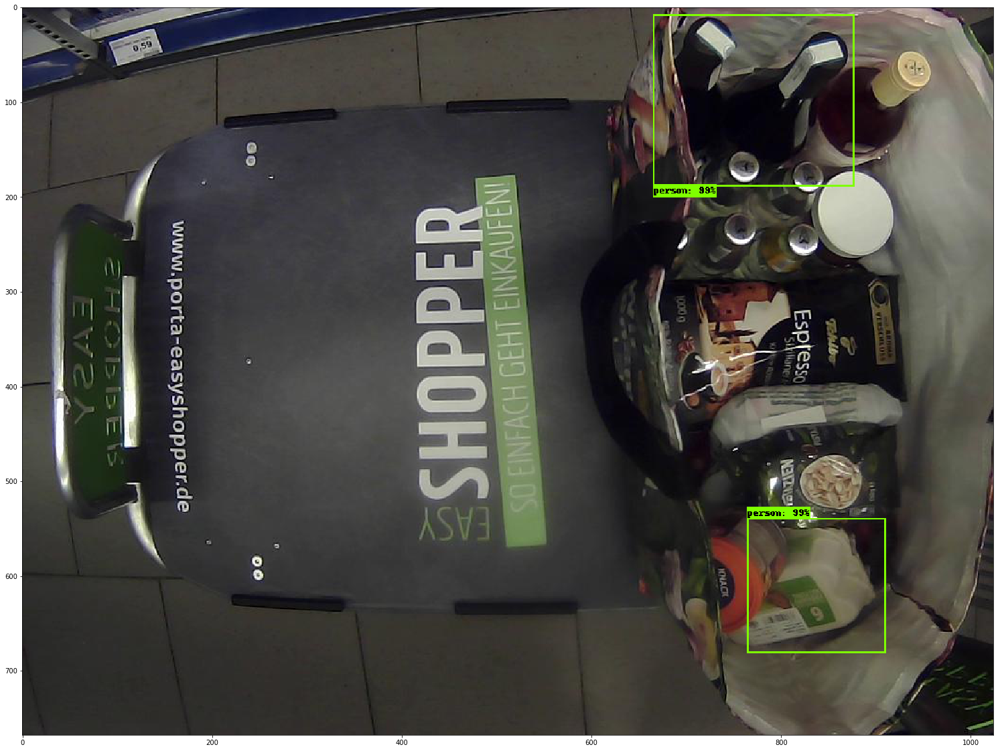

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


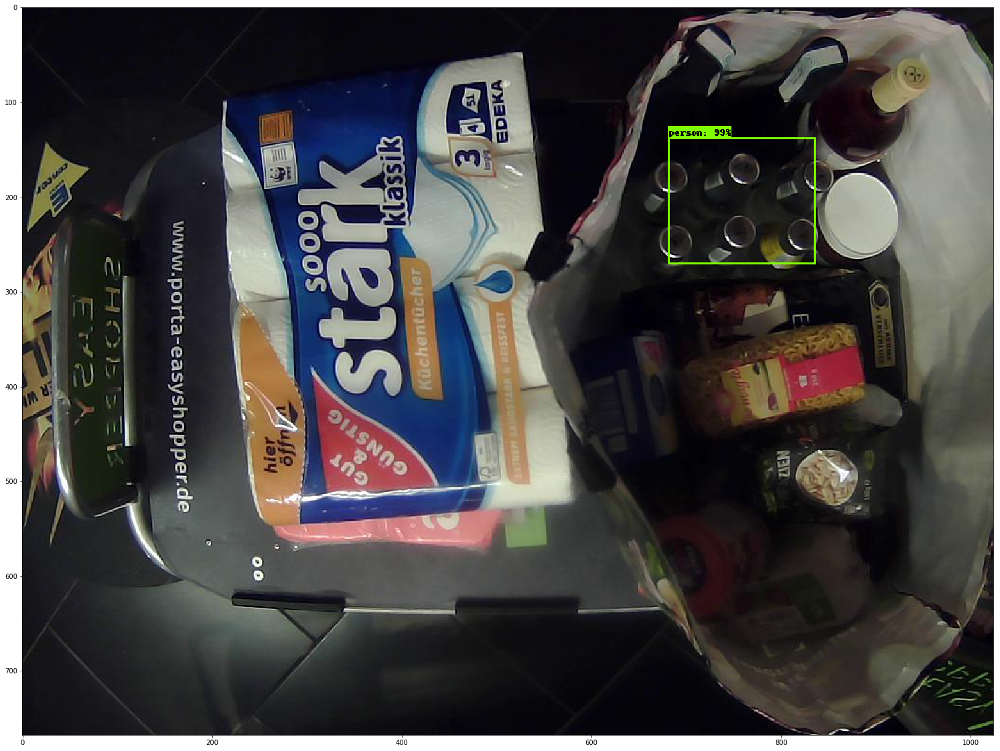

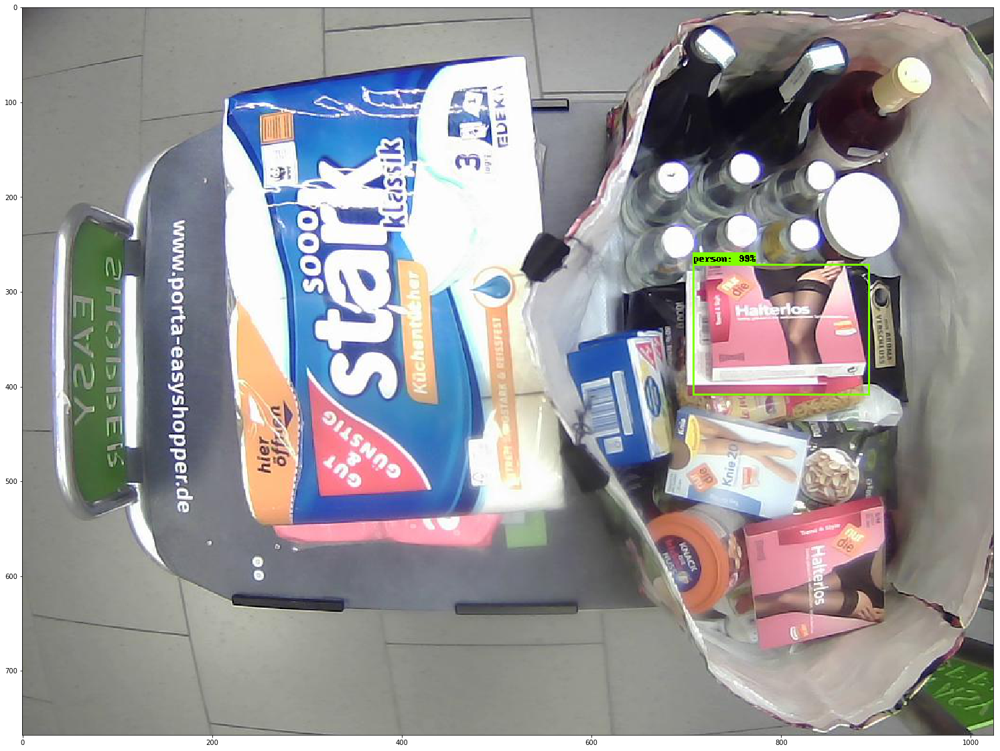

In [14]:
for session in sorted(os.listdir(SESSIONS_PATH)):
    try:
        a = int(session)
    except:
        print (session)
        continue
    
    print(session)
    session_path = os.path.join(SESSIONS_PATH, session)
    if not os.path.exists(os.path.join(session_path, "annotations")):
        continue
    
    for image_fname in sorted(os.listdir(session_path)):
        if not image_fname.endswith(".jpg"):
            continue
        image = Image.open(os.path.join(session_path, image_fname))
        # the array based representation of the image will be used later in order to prepare the
        # result image with boxes and labels on it.
        image_np = load_image_into_numpy_array(image)
        # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
        label_path = os.path.join(session_path, "annotations", os.path.splitext(image_fname)[0] + ".xml")
        labels = get_labels(label_path) if os.path.exists(label_path) else None
        print (session, image_fname, len(labels))
        output_dict = run_inference_for_single_image(image_np, detection_graph)
        if labels:
            output_dict = filter_detections(output_dict, labels)
            # Visualization of the results of a detection.
            vis_util.visualize_boxes_and_labels_on_image_array(
              image_np,
              output_dict['detection_boxes'],
              output_dict['detection_classes'],
              output_dict['detection_scores'],
              category_index,
              instance_masks=output_dict.get('detection_masks'),
              use_normalized_coordinates=True,
              line_thickness=2)
            plt.figure(figsize=IMAGE_SIZE)
            plt.imshow(image_np)
    #         print(output_dict['detection_boxes'])
        else:
            print("a murit dumitru")
        
    break
    